<a href="https://colab.research.google.com/github/iz-120/eda-desigualdade-economica-e-de-genero/blob/main/IMT_Projeto_S1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://github.com/Rogerio-mack/IMT_CD_2024/blob/main/maua_logo.png?raw=true" width=300, align="right">



# **Exploratory Data Analysis (EDA)**

## Relacionando Desigualdade Econômica com a Participação Feminina no Mercado de Trabalho

In [ ]:
#@title **Identificação do Grupo**

#@markdown Nomes completos em ordem alfabética (*\<nome\>, \<RA\>*)
Aluno1 = 'Izabel Sampaio Goes, 21000980' #@param {type:"string"}
Aluno2 = 'Júlia Galhardi Cerqueira, 21019975' #@param {type:"string"}
Aluno3 = 'None' #@param {type:"string"}
Aluno4 = 'None' #@param {type:"string"}
Aluno5 = 'None' #@param {type:"string"}





# **Resumo (*Abstract*)**

Este trabalho investiga a relação entre desigualdade econômica e disparidade de gênero no mercado de trabalho, com dados da World Income Inequality Database e do World Bank' Gender Data. As análises mostraram que maior desigualdade de renda se associa a menor participação feminina no mercado de trabalho. O estudo reforça a importância de políticas que atuem simultaneamente sobre desigualdade e equidade de gênero.



# **Introdução**

Com este trabalho, buscamos analisar a relação entre a desigualdade econômica e a disparidade de gênero no mercado de trabalho, com base em dados da **World Income Inequality Database** e do **World Bank's Gender Data**. A desigualdade econômica foi mensurada por meio do **coeficiente de Gini**, enquanto a disparidade de gênero foi avaliada utilizando indicadores como a **razão de participação feminina/masculina** na força de trabalho e a **razão de desemprego entre mulheres e homens**.

A escolha desses indicadores se justifica pela sua ampla aceitação acadêmica e institucional como medidas das desigualdades sociais e econômicas. Além disso, são dados disponíveis de forma padronizada e comparável internacionalmente, permitindo análises consistentes.

As técnicas de análise empregadas incluem:
- **Correlação de Pearson e Spearman** para aferir associações entre variáveis;
- **Teste t para comparação de médias** entre grupos de países com diferentes níveis de desigualdade;
- **Análise de séries temporais** com modelagem via **ARIMA**, para explorar tendências e possibilidades de previsão.

A relevância e atualidade deste estudo são evidentes no contexto das discussões globais sobre a promoção da **igualdade de gênero** e a **redução das desigualdades socioeconômicas**, dois dos principais **Objetivos de Desenvolvimento Sustentável (ODS)** da **ONU**.

Este estudo contribui ao campo ao propor uma abordagem quantitativa e comparativa, que evidencia padrões gerais e identifica limitações importantes nas análises tradicionais. O impacto potencial desta análise está na geração de evidências que mostram como a diminuição da desigualdade econômica pode se relacionar com o aumento da igualdade de gênero no mercado de trabalho, trazendo insights que poderiam embasar políticas públicas e iniciativas voltadas à promoção de maior equidade econômica e de gênero.

# **Download e importação de bibliotecas**

In [ ]:
!pip install wbgapi
!pip install streamlit
!pip install ydata_profiling

In [ ]:
import pandas as pd
import wbgapi as wb
import numpy as np
import scipy.stats as stats
from ydata_profiling import ProfileReport
import plotly.express as px
import plotly.graph_objects as go
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.preprocessing import PolynomialFeatures
import streamlit as st

In [ ]:
# Definindo paleta de cores
verde_musgo = "#769149"
verde_menta = "#4a9864"
roxo="#a972c7"

# **Descrição e origem dos dados**

1. **World Bank's Gender Data (Fonte 14 no `wbgapi`)** para capturar as principais métricas de participação e condições de trabalho de homens e mulheres, utilizamos a biblioteca `wbgapi` para acesso direto ao Gender Data Portal do Banco Mundial (World Bank)

2. **World Income Inequality Database (WIID, versão de 29 de abril de 2025)** para avaliar a disparidade econômica geral (quanto a renda está concentrada nos estratos superiores da população), usamos o arquivo Excel oficial do World Income Inequality Database (WIID), mantido pelo UNU-WIDER








In [ ]:
# World Bank’s Gender Data
# Visualiza todas as bases disponíveis
wb.source.info()

# Seleciona "Gender Statistics"
wb.db = 14

# Exibe todas as colunas presentes na base em forma de lista
wb.series.info()

# Exibe todas as colunas presentes na base em forma de Series
wb.series.Series()

,SeriesName
account.t.d,Account (% age 15+)
account.t.d.1,"Account, female (% age 15+)"
account.t.d.2,"Account, male (% age 15+)"
borrow.any,Borrowed any money (% age 15+)
borrow.any.1,"Borrowed any money, female (% age 15+)"
...,...
UIS.ROFST.3.F.CP,"Rate of out-of-school youth of upper secondary school age, female (%)"
UIS.ROFST.3.M.CP,"Rate of out-of-school youth of upper secondary school age, male (%)"
VC.IHR.PSRC.FE.P5,"Intentional homicides, female (per 100,000 female)"
VC.IHR.PSRC.MA.P5,"Intentional homicides, male (per 100,000 male)"


In [ ]:
# World Income Inequality Database
# Baixando dados (UNU-WIDER, World Income Inequality Database (WIID). Version 29 April 2025)
url_wid = "https://www.wider.unu.edu/sites/default/files/WIID/WIID-29APR2025.xlsx"

# Criando database
df_wid_raw = pd.read_excel(url_wid, skiprows=0)

# Exibe database
df_wid_raw

,id,country,c3,c2,year,gini,ge0,ge1,ge2,a025,a050,a075,a1,a2,palma,ratio_top20bottom20,bottom40,q1,q2,q3,q4,q5,d1,d2,d3,d4,d5,d6,d7,d8,d9,d10,bottom5,top5,resource,resource_detailed,scale,scale_detailed,sharing_unit,reference_unit,areacovr,areacovr_detailed,popcovr,popcovr_detailed,region_un,region_un_sub,region_wb,eu,oecd,incomegroup,mean,median,currency,reference_period,exchangerate,mean_usd,median_usd,gdp,population,revision,quality,quality_score,source,source_detailed,source_comments,survey,link,pop_share,inc_share,w_ge0,w_ge1,w_ge2,w_a050,w_a1,b_ge0,b_ge1,b_ge2,b_a050,b_a1,wiidcompanion
0,1,Afghanistan,AFG,AF,2008,29.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.33,22.00,9.00,13.00,17.00,22.00,39.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumption,Consumption,Per capita,Per capita,Household,Person,All,All,All,All,Asia,Southern Asia,South Asia,Non-EU,Non-OECD,Low income,31856.0,NaN,Afghan afghani 2016,Year,NaN,NaN,NaN,2192.0,26482622.0,New 2019,High,12,National statistical authority,European Union and the Central Statistics Organization of Afghanistan,NaN,Living Conditions Survey (LCS),https://cso-of-afghanistan.shinyapps.io/ALCS_Dashboard/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes
1,2,Afghanistan,AFG,AF,2012,33.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.11,23.00,9.00,14.00,17.00,22.00,37.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumption,Consumption,Per capita,Per capita,Household,Person,All,All,All,All,Asia,Southern Asia,South Asia,Non-EU,Non-OECD,Low income,32724.0,NaN,Afghan afghani 2016,Year,NaN,NaN,NaN,2985.0,30560034.0,New 2019,High,12,National statistical authority,European Union and the Central Statistics Organization of Afghanistan,NaN,Living Conditions Survey (LCS),https://cso-of-afghanistan.shinyapps.io/ALCS_Dashboard/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes
2,3,Afghanistan,AFG,AF,2017,31.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.44,22.00,9.00,13.00,16.00,22.00,40.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumption,Consumption,Per capita,Per capita,Household,Person,All,All,All,All,Asia,Southern Asia,South Asia,Non-EU,Non-OECD,Low income,26792.0,NaN,Afghan afghani 2016,Year,NaN,NaN,NaN,2953.0,35688932.0,New 2019,High,12,National statistical authority,European Union and the Central Statistics Organization of Afghanistan,NaN,Living Conditions Survey (LCS),https://eeas.europa.eu/regions/asia/44072/results-afghanistan-living-conditions-survey-alcs-2016-17-released_en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes
3,4,Albania,ALB,AL,1996,27.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.90,3.93,23.05,9.16,13.89,17.59,23.39,35.96,3.88,5.28,6.37,7.52,8.35,9.25,10.78,12.61,15.25,20.71,NaN,NaN,Consumption,Consumption,Per capita,Per capita,Household,Person,All,All,All,All,Europe,Southern Europe,Europe and Central Asia,Non-EU,Non-OECD,Upper middle income,2896.0,2545.0,US$2021PPP,Year,NaN,NaN,NaN,5499.0,3245678.0,New 2025,Average,13,World Bank,Poverty and Inequality Platform (PIP),NaN,EWS,https://pip.worldbank.org/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes
4,5,Albania,ALB,AL,2002,31.74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.21,4.82,20.96,8.37,12.59,16.48,22.22,40.34,3.52,4.85,5.85,6.74,7.64,8.84,10.23,11.99,15.00,25.34,NaN,NaN,Consumption,Consumption,Per capita,Per capita,Household,Person,All,All,All,All,Europe,Southern Europe,Europe and Central Asia,Non-EU,Non-OECD,Upper middle income,2960.0,2441.0,US$2021PPP,Year,NaN,NaN,NaN,7566.0,3134092.0,New 2025,Average,13,World Bank,Poverty and Inequality Platform (PIP),Series 2002-2012,LSMS,https://pip.worldbank.org/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26261,26262,Zimbabwe,ZWE,ZW,2011,37.00,NaN,NaN,Na

# **Aquisição e Preparação dos dados**

* Seleção das colunas pertinentes para a análise e filtragem
* Transformações para garantir dados uniformes, completos e coerentes
* União das bases de dados
* Remoção de colunas utilizadas apenas para filtragem e não pertinentes para análise








## **Seleção das colunas**

Dado que as bases de dados possuem uma grande quantidade de dados, iremos selecionar aqueles mais pertinentes à análise aqui desenvolvida

**World Bank's Gender Data**

Para medir a disparidade de gênero no mercado de trabalho, foram selecionados os seguintes indicadores:
* `SL.TLF.CACT.FE.ZS`: Taxa de participação na força de trabalho, mulheres (15+ anos) — porcentagem da população feminina ativa.
* `SL.TLF.CACT.MA.ZS`: Taxa de participação na força de trabalho, homens (15+ anos) — porcentagem da população masculina ativa.
* `SL.TLF.CACT.FM.ZS`: Razão entre taxa de participação feminina e masculina (%) — relação da participação das mulheres em comparação aos homens.
* `SL.EMP.TOTL.SP.FE.ZS`: Razão de emprego sobre a população (15+ anos), mulheres (%) — proporção de mulheres empregadas em relação à população feminina.
* `SL.EMP.TOTL.SP.MA.ZS`: Razão de emprego sobre a população (15+ anos), homens (%) — proporção de homens empregados em relação à população masculina.
* `SL.UEM.TOTL.FE.ZS`: Taxa de desemprego, mulheres (% da força de trabalho feminina) — porcentagem de mulheres desempregadas dentro da força de trabalho feminina.
* `SL.UEM.TOTL.MA.ZS`: Taxa de desemprego, homens (% da força de trabalho masculina) — porcentagem de homens desempregados dentro da força de trabalho masculina.
* `SL.EMP.VULN.FE.ZS`: Emprego vulnerável, mulheres (% das mulheres empregadas) — porcentagem de mulheres em empregos precários ou informais.
* `SL.EMP.VULN.MA.ZS`: Emprego vulnerável, homens (% dos homens empregados) — porcentagem de homens em empregos precários ou informais.
* `SG.GEN.TECH.ZS`: Percentual de profissionais e técnicos que são mulheres (% do total dessas ocupações) — mede a participação feminina em profissões qualificadas.
* `IC.FRM.FEMM.ZS`: Percentual de firmas com mulher como top manager (% das empresas) — proporção de empresas cujo principal executivo é mulher.

In [ ]:
# Seleção dos indicadores utilizados
lista_indicadores_wb = [
    'SL.TLF.CACT.FE.ZS',  # participação feminina 15+
    'SL.TLF.CACT.MA.ZS',  # participação masculina 15+
    'SL.TLF.CACT.FM.ZS',  # razão feminina/masculina
    'SL.EMP.TOTL.SP.FE.ZS',  # emprego feminino 15+
    'SL.EMP.TOTL.SP.MA.ZS',  # emprego masculino 15+
    'SL.UEM.TOTL.FE.ZS',     # desemprego feminino 15+
    'SL.UEM.TOTL.MA.ZS',     # desemprego masculino 15+
    'SL.EMP.VULN.FE.ZS',     # emprego vulnerável feminino
    'SL.EMP.VULN.MA.ZS',     # emprego vulnerável masculino
    'SG.GEN.TECH.ZS',        # % mulheres em profissões técnicas/profissionais
    'IC.FRM.FEMM.ZS',        # % firmas com mulher como top manager
]

# Seleciona intervalo de tempo para análise
range_anos = range(2010, 2021) # 2010 a 2020

# Criando dataframe com todos os dados (todos os países e todos os anos)
df_raw = wb.data.DataFrame(lista_indicadores_wb, economy='all', time=range_anos)

**World Income Inequality Database**

Para medir a desigualdade econômica, foram selecionados os seguintes indicadores:
* `c3`: Código ISO-3 do país

* `country`: Nome completo do país

* `year`: Ano de referência

* `gini`: Coeficiente de Gini (renda líquida ou “pós-ajustes”), métrica central de disparidade econômica

* `palma`: Índice de Palma: razão (renda dos 10% mais ricos) ÷ (renda dos 40% mais pobres)

* `ratio_top20bottom20`: Razão “Top 20 % / Bottom 20 %” da distribuição de renda



In [ ]:
# Seleção dos indicadores utilizados
lista_indicadores_wid = [
    "c3", # iso
    "country",
    "year",
    "gini", # Gini líquido, métrica central de disparidade econômica
    "palma", # Razão entre a parcela de renda do 10% mais rico e a parcela de renda dos 40% mais pobres
    "ratio_top20bottom20", # Razão “top 20%/bottom 20%”; outro indicador agregador de disparidade
    "areacovr", # Área do país coberta pela pesquisa
    "resource", # Medida usada para calcular o Gini (ex.: renda bruta ou renda líquida)
    "popcovr", # Mostra a cobertura populacional
    "scale", # Especifica a escala de equivalência familiar usada
    "quality", # Avalia a confiabilidade do survey
    "currency" # Identifica a moeda utilizada no cálculo
]

# Aplicando seleção de colunas que serão utilizadas
df_wid = df_wid_raw[lista_indicadores_wid].copy()

# Renomeia coluna iso3
df_wid.rename(columns={'c3':'iso3'}, inplace=True)

# Exibe dataset
df_wid.head()

,iso3,country,year,gini,palma,ratio_top20bottom20,areacovr,resource,popcovr,scale,quality,currency
0,AFG,Afghanistan,2008,29.00,NaN,4.33,All,Consumption,All,Per capita,High,Afghan afghani 2016
1,AFG,Afghanistan,2012,33.00,NaN,4.11,All,Consumption,All,Per capita,High,Afghan afghani 2016
2,AFG,Afghanistan,2017,31.00,NaN,4.44,All,Consumption,All,Per capita,High,Afghan afghani 2016
3,ALB,Albania,1996,27.01,0.90,3.93,All,Consumption,All,Per capita,Average,US$2021PPP
4,ALB,Albania,2002,31.74,1.21,4.82,All,Consumption,All,Per capita,Average,US$2021PPP


## **Ajustes de formato do dataframe**

Modificações no formato da base de dados de gênero para desacoplar linhas, transformar as datas em apenas uma coluna de data e criar uma coluna para cada indicador.

In [ ]:
# Alongando dataframe
df_long = (
    df_raw
      .stack()                        # empilha ano × país em índice único
      .reset_index(name='value')      # cria colunas ‘time’, ‘economy’, e ‘value’
      .rename(columns={
          'time':'year',
          'economy':'iso3'
      })
)

# Renomeia as coluans
df_long.rename(columns={'series':'indicator_code', 'level_2':'year'}, inplace=True)

# Transforma os indicadores em colunas
df_gender_labor = df_long.pivot_table(
    index=['iso3','year'],
    columns='indicator_code',
    values='value'
).reset_index()

# Juntar com a tabela de nomes dos países (coluna ‘country')
paises = pd.DataFrame(wb.economy.list())  # tem colunas ‘id’ (ISO3), ‘value’ (nome do país)
df_gender_labor = df_gender_labor.merge(
    paises[['id','value']],
    left_on='iso3',
    right_on='id',
    how='left'
).drop(columns=['id'])

# Renomeia coluna de país
df_gender_labor.rename(columns={'value':'country'}, inplace=True)

# Renomeia database para facilitar manuseio
df_wbg = df_gender_labor

# Exibe head
df_wbg.head()

,iso3,year,IC.FRM.FEMM.ZS,SL.EMP.TOTL.SP.FE.ZS,SL.EMP.TOTL.SP.MA.ZS,SL.EMP.VULN.FE.ZS,SL.EMP.VULN.MA.ZS,SL.TLF.CACT.FE.ZS,SL.TLF.CACT.FM.ZS,SL.TLF.CACT.MA.ZS,SL.UEM.TOTL.FE.ZS,SL.UEM.TOTL.MA.ZS,country
0,AFE,YR2010,NaN,59.535948,71.298788,79.963053,65.775903,64.774449,86.101953,76.491744,8.087223,6.789176,Africa Eastern and Southern
1,AFE,YR2011,NaN,59.973247,71.663380,79.447060,65.326762,65.325625,86.279535,76.842246,8.193389,6.739538,Africa Eastern and Southern
2,AFE,YR2012,NaN,60.041739,71.851988,79.048913,64.967866,65.169641,86.020122,76.902130,7.868224,6.566892,Africa Eastern and Southern
3,AFE,YR2013,NaN,60.169298,71.913358,78.550764,64.644621,65.122643,86.011202,76.857515,7.606207,6.433035,Africa Eastern and Southern
4,AFE,YR2014,NaN,59.326098,71.171046,78.102674,64.343984,64.161067,85.666985,76.056801,7.535392,6.423899,Africa Eastern and Southern


## **Outros ajustes antes do merge**

* Chaves do join: país e ano
* Garantir mesmo range de datas
* Verificar range de países
* Garantir formatos iguais para dados que serão usados como chave no join


### **World Bank's Gender Data**
* Ajusta o formato de data
* Verifica se a combinação país-ano é chave única

In [ ]:
# Ajustando formato das datas
# Exibir os valores únicos para verificar o formato
display(df_wbg['year'].unique())

# Exibir o tipo de dado antes da transformação
display(df_wbg['year'].dtype)

# Removendo prefixo 'YR'
df_wbg['year'] = df_wbg['year'].str.replace('YR', '', regex=False)

# Convertendo a coluna 'year' para numérico, lidando com possíveis erros
df_wbg['year'] = pd.to_numeric(df_wbg['year'], errors='coerce')

# Exibir o tipo de dado após a transformação
display(df_wbg['year'].dtype)

# Exibir os valores únicos para verificar se o 'YR' foi removido e a conversão para numérico foi bem-sucedida
display(df_wbg['year'].unique())

array(['YR2010', 'YR2011', 'YR2012', 'YR2013', 'YR2014', 'YR2015',
       'YR2016', 'YR2017', 'YR2018', 'YR2019', 'YR2020'], dtype=object)

dtype('O')

dtype('int64')

array([2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])

In [ ]:
# Verifica se a combinação país-ano é uma chave única (para usar no join)
# Verifica se a combinação 'iso3' e 'year' é única
is_unique_wbg = df_wbg.set_index(['iso3', 'year']).index.is_unique

if is_unique_wbg:
    print("A combinação de 'iso3' e 'year' é uma chave única no dataframe 'df_wbg'.")
else:
    print("A combinação de 'iso3' e 'year' NÃO é uma chave única no dataframe 'df_wbg'.")

A combinação de 'iso3' e 'year' é uma chave única no dataframe 'df_wbg'.


### **World Income Inequality Database**
* Ajusta range de data
* Filtra linhas para garantir unicidade do conjunto país-ano como chave

In [ ]:
# Para ficar com o mesmo range de datas que o outro dataset
df_wid = df_wid[(df_wid['year'] >= 2010) & (df_wid['year'] <= 2020)]

In [ ]:
# Visualizando valores NaN de cada coluna
print("\nNúmero de valores NaN por coluna em df_wid:")
print(df_wid.isnull().sum())

# Removendo linhas com valores de Gini NaN (não tem como analisar)
df_wid.dropna(subset=['gini', 'palma', 'ratio_top20bottom20'], inplace=True)
print("\nNúmero de valores NaN por coluna em df_wid após a remoção de NaNs:")
print(df_wid.isnull().sum())


Número de valores NaN por coluna em df_wid:
iso3                      0
country                   0
year                      0
gini                     65
palma                  1524
ratio_top20bottom20    1388
areacovr                  0
resource                  0
popcovr                   0
scale                     4
quality                   0
currency               1801
dtype: int64

Número de valores NaN por coluna em df_wid após a remoção de NaNs:
iso3                     0
country                  0
year                     0
gini                     0
palma                    0
ratio_top20bottom20      0
areacovr                 0
resource                 0
popcovr                  0
scale                    0
quality                  0
currency               835
dtype: int64


<ipython-input-51-c429b5bb0acf>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Verifica se a combinação 'iso3' e 'year' é única
is_unique_wid__1 = df_wid.set_index(['iso3', 'year']).index.is_unique
if is_unique_wid__1:
    print("A combinação de 'iso3' e 'year' é uma chave única no dataframe 'df_wid'.")
else:
    print("A combinação de 'iso3' e 'year' NÃO é uma chave única no dataframe 'df_wid'.")

# Adiciona filtros para padronizar métricas de cálculo e individualizar a chave
# Filtrar apenas renda líquida para padronizar a métrica de cáculo do bem-estar
df_wid = df_wid[df_wid['resource'] == 'Income (net)']

# Filtrar para escala per capita
df_wid = df_wid[df_wid['scale'] == 'Per capita']

# Cria lista de linhas com chave país-ano duplicada
duplicated_iso_year = df_wid[df_wid.duplicated(['iso3', 'year'], keep=False)][['iso3', 'year']].drop_duplicates()

# Cria máscara booleana para linhas que fazem parte de grupo com chave duplicada
mask_is_duplicated_group = df_wid.set_index(['iso3', 'year']).index.isin(duplicated_iso_year.set_index(['iso3', 'year']).index)

# Cria máscara booleana para linhas com currency = 'US$2021PPP'
mask_currency_ppp = df_wid['currency'] == 'US$2021PPP'

# Combina as máscara: mantém linhas que NÃO são duplicas OU
# são parte de grupo com chave duplicada E possuem currency 'US$2021PPP'
df_wid = df_wid[~mask_is_duplicated_group | (mask_is_duplicated_group & mask_currency_ppp)].copy()

# Verifica se a combinação 'iso3' e 'year' é única após transformação
is_unique_wid__2 = df_wid.set_index(['iso3', 'year']).index.is_unique
if is_unique_wid__2:
    print("A combinação de 'iso3' e 'year' é uma chave única no dataframe 'df_wid'.")
else:
    print("A combinação de 'iso3' e 'year' NÃO é uma chave única no dataframe 'df_wid'.")

A combinação de 'iso3' e 'year' NÃO é uma chave única no dataframe 'df_wid'.
A combinação de 'iso3' e 'year' é uma chave única no dataframe 'df_wid'.


### **Comparação de ambos**
* Visualiza diferença entre ranges de ano e país
* verifica se cada país tem todos os anos do range
* Verifica se os pares de chave país-ano são os mesmo nos dois dataframes
* Filtra dataframes para possuírem mesmas chaves

In [ ]:
# -----------ranges----------------------------------------------------------------------------------------------------------
print("-----------------Compara ranges de anos e países-----------------------------")
# Comparar o range de anos
years_wbg = set(df_wbg['year'].unique())
years_wid = set(df_wid['year'].unique())

if years_wbg == years_wid:
    print("O range de anos em 'df_wbg' e 'df_wid' é o mesmo.")
else:
    print("O range de anos em 'df_wbg' e 'df_wid' NÃO é o mesmo.")
    print(f"Anos em df_wbg: {sorted(list(years_wbg))}")
    print(f"Anos em df_wid: {sorted(list(years_wid))}")
    print(f"Anos apenas em df_wbg: {sorted(list(years_wbg - years_wid))}")
    print(f"Anos apenas em df_wid: {sorted(list(years_wid - years_wbg))}")

# Comparar os países (iso3 codes)
countries_wbg = set(df_wbg['iso3'].unique())
countries_wid = set(df_wid['iso3'].unique())

if countries_wbg == countries_wid:
    print("\nOs países (ISO3) em 'df_wbg' e 'df_wid' são os mesmos.")
else:
    print("\nOs países (ISO3) em 'df_wbg' e 'df_wid' NÃO são os mesmos.")
    print(f"Total de países em df_wbg: {len(countries_wbg)}")
    print(f"Total de países em df_wid: {len(countries_wid)}")
    print(f"Países apenas em df_wbg: {sorted(list(countries_wbg - countries_wid))}")
    print(f"Países apenas em df_wid: {sorted(list(countries_wid - countries_wbg))}")

# Identifica países que estão nos dois dataframes ao mesmo tempo
countries_in_both = countries_wbg.intersection(countries_wid)

# Filtrar df_wbg para manter apenas os países que estão em countries_in_both
df_wbg = df_wbg[df_wbg['iso3'].isin(countries_in_both)].copy()

# Filtrar df_wid para manter apenas os países que estão em countries_in_both
df_wid = df_wid[df_wid['iso3'].isin(countries_in_both)].copy()

# Comparar os países (iso3 codes)
countries_wbg = set(df_wbg['iso3'].unique())
countries_wid = set(df_wid['iso3'].unique())

if countries_wbg == countries_wid:
    print("\nOs países (ISO3) em 'df_wbg' e 'df_wid' agora são os mesmos.")
else:
    print("\nOs países (ISO3) em 'df_wbg' e 'df_wid' ainda NÃO são os mesmos.")
    print(f"Total de países em df_wbg: {len(countries_wbg)}")
    print(f"Total de países em df_wid: {len(countries_wid)}")
    print(f"Países apenas em df_wbg: {sorted(list(countries_wbg - countries_wid))}")
    print(f"Países apenas em df_wid: {sorted(list(countries_wid - countries_wbg))}")

-----------------Compara ranges de anos e países-----------------------------
O range de anos em 'df_wbg' e 'df_wid' é o mesmo.

Os países (ISO3) em 'df_wbg' e 'df_wid' NÃO são os mesmos.
Total de países em df_wbg: 240
Total de países em df_wid: 60
Países apenas em df_wbg: ['AFE', 'AFG', 'AFW', 'AGO', 'ALB', 'ARB', 'ARE', 'ARG', 'ARM', 'ATG', 'AZE', 'BDI', 'BEN', 'BFA', 'BGD', 'BHR', 'BHS', 'BIH', 'BLR', 'BLZ', 'BOL', 'BRB', 'BRN', 'BTN', 'BWA', 'CAF', 'CEB', 'CHI', 'CMR', 'COD', 'COG', 'COM', 'CPV', 'CRI', 'CSS', 'CUB', 'DJI', 'DMA', 'DOM', 'DZA', 'EAP', 'EAR', 'EAS', 'ECA', 'ECS', 'ECU', 'EMU', 'ERI', 'ETH', 'EUU', 'FCS', 'FJI', 'GAB', 'GHA', 'GIN', 'GMB', 'GNB', 'GNQ', 'GRD', 'GUM', 'GUY', 'HIC', 'HKG', 'HND', 'HPC', 'HTI', 'IBD', 'IBT', 'IDA', 'IDB', 'IDN', 'IDX', 'IRN', 'JAM', 'KAZ', 'KEN', 'KGZ', 'KHM', 'KNA', 'KWT', 'LAC', 'LAO', 'LBN', 'LBR', 'LBY', 'LCA', 'LCN', 'LDC', 'LIC', 'LKA', 'LMC', 'LMY', 'LSO', 'LTE', 'MAC', 'MAR', 'MDA', 'MDG', 'MDV', 'MEA', 'MIC', 'MKD', 'MMR', 'MNA

In [ ]:
# Função para checar se cada país tem todos os anos do range
def count_countries_with_all_years(df, year_range):
    required_years = set(year_range)
    countries_with_all_years_count = 0
    countries_with_all_years_list = []

    for iso3, group in df.groupby('iso3'):
        available_years = set(group['year'].unique())
        if required_years.issubset(available_years):
            countries_with_all_years_count += 1
            countries_with_all_years_list.append(iso3)

    return countries_with_all_years_count, countries_with_all_years_list

# Conta países em df_wbg com todos os anos do range
count_wbg, countries_wbg = count_countries_with_all_years(df_wbg, range_anos)
print(f"Quantidade de países em df_wbg com todos os anos de {min(range_anos)} a {max(range_anos)}: {count_wbg}")
# print(f"Países em df_wbg com todos os anos: {countries_wbg}") # Opcional: lista de países

# Conta países em df_wid com todos os anos do range
count_wid, countries_wid = count_countries_with_all_years(df_wid, range_anos)
print(f"Quantidade de países em df_wid com todos os anos de {min(range_anos)} a {max(range_anos)}: {count_wid}")
# print(f"Países em df_wid com todos os anos: {countries_wid}") # Opcional: lista de países

Quantidade de países em df_wbg com todos os anos de 2010 a 2020: 59
Quantidade de países em df_wid com todos os anos de 2010 a 2020: 36


In [ ]:
# ---------pares de chave-----------------------------------------------------------------------------------------------------------------------
print("-----------------Compara pares de chave país-ano antes-----------------------------")
# Ver o número de pares país-ano em cada dataframe
print(f"\nNúmero de pares (país, ano) em df_wbg: {len(df_wbg)}")
print(f"Número de pares (país, ano) em df_wid: {len(df_wid)}")

# Verificar se todos os pares país-ano de df_wid estão presentes em df_wbg
merged_keys_wid = set([(iso, year) for iso, year in zip(df_wid['iso3'], df_wid['year'])])
merged_keys_wbg = set([(iso, year) for iso, year in zip(df_wbg['iso3'], df_wbg['year'])])

if merged_keys_wid.issubset(merged_keys_wbg):
    print("\nTodos os pares (país, ano) presentes em 'df_wid' também estão presentes em 'df_wbg'.")
else:
    print("\nAlguns pares (país, ano) presentes em 'df_wid' NÃO estão presentes em 'df_wbg'.")
    missing_in_wbg = sorted(list(merged_keys_wid - merged_keys_wbg))
    print(f"Pares (país, ano) em df_wid que faltam em df_wbg: {missing_in_wbg}")

# Verificar se todos os pares país-ano de df_wbg estão presentes em df_wid
if merged_keys_wbg.issubset(merged_keys_wid):
    print("\nTodos os pares (país, ano) presentes em 'df_wbg' também estão presentes em 'df_wid'.")
else:
    print("\nAlguns pares (país, ano) presentes em 'df_wbg' NÃO estão presentes em 'df_wid'.")
    missing_in_wid = sorted(list(merged_keys_wbg - merged_keys_wid))
    print(f"Pares (país, ano) em df_wbg que faltam em df_wid: {missing_in_wid}")


# Mantém em ambos os dataframes apenas os mesmos conjuntos de países com todos os anos do range
# Identifica os países presentes em ambos os dataframes E com todos os anos do range
countries_with_all_years_in_both = set(countries_wbg).intersection(set(countries_wid))

print(f"\nQuantidade de países presentes em ambos dataframes com todos os anos de {min(range_anos)} a {max(range_anos)}: {len(countries_with_all_years_in_both)}")

# Filtrando ambos os dataframes para manter apenas aqueles países
df_wbg = df_wbg[df_wbg['iso3'].isin(countries_with_all_years_in_both)].copy()
df_wid = df_wid[df_wid['iso3'].isin(countries_with_all_years_in_both)].copy()

print("-----------------Compara pares de chave país-ano depois-----------------------------")
# Ver o número de pares país-ano em cada dataframe
print(f"\nNúmero de pares (país, ano) em df_wbg: {len(df_wbg)}")
print(f"Número de pares (país, ano) em df_wid: {len(df_wid)}")

# Verificar se todos os pares país-ano de df_wid estão presentes em df_wbg
merged_keys_wid = set([(iso, year) for iso, year in zip(df_wid['iso3'], df_wid['year'])])
merged_keys_wbg = set([(iso, year) for iso, year in zip(df_wbg['iso3'], df_wbg['year'])])

if merged_keys_wid.issubset(merged_keys_wbg):
    print("\nTodos os pares (país, ano) presentes em 'df_wid' também estão presentes em 'df_wbg'.")
else:
    print("\nAlguns pares (país, ano) presentes em 'df_wid' NÃO estão presentes em 'df_wbg'.")
    missing_in_wbg = sorted(list(merged_keys_wid - merged_keys_wbg))
    print(f"Pares (país, ano) em df_wid que faltam em df_wbg: {missing_in_wbg}")


-----------------Compara pares de chave país-ano antes-----------------------------

Número de pares (país, ano) em df_wbg: 649
Número de pares (país, ano) em df_wid: 511

Todos os pares (país, ano) presentes em 'df_wid' também estão presentes em 'df_wbg'.

Alguns pares (país, ano) presentes em 'df_wbg' NÃO estão presentes em 'df_wid'.
Pares (país, ano) em df_wbg que faltam em df_wid: [('AUS', 2011), ('AUS', 2012), ('AUS', 2013), ('AUS', 2015), ('AUS', 2017), ('AUS', 2019), ('AUS', 2020), ('BRA', 2010), ('BRA', 2012), ('BRA', 2014), ('BRA', 2015), ('CHL', 2010), ('CHL', 2012), ('CHL', 2014), ('CHL', 2016), ('CHL', 2018), ('CHL', 2019), ('CHL', 2020), ('CHN', 2011), ('CHN', 2012), ('CHN', 2013), ('CHN', 2015), ('CHN', 2016), ('CHN', 2017), ('CHN', 2018), ('CHN', 2020), ('CIV', 2010), ('CIV', 2011), ('CIV', 2012), ('CIV', 2013), ('CIV', 2014), ('CIV', 2016), ('CIV', 2017), ('CIV', 2018), ('CIV', 2019), ('CIV', 2020), ('EGY', 2010), ('EGY', 2012), ('EGY', 2014), ('EGY', 2016), ('EGY', 201

## **Merge dos dataframes**
* Faz a união dos dataframes pela chave país-data
* Remove colunas que não serão úteis para análise
* Renomeia coluna country_x para country

In [ ]:
# Faz merge dos dois dataframes
df_merged = df_wbg.merge(df_wid, on=['iso3', 'year'], how='left')

# Possibilita visualizar todas as colunas e todo o conteúdo de cada coluna
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# Exibe head
df_merged.head()

,iso3,year,IC.FRM.FEMM.ZS,SL.EMP.TOTL.SP.FE.ZS,SL.EMP.TOTL.SP.MA.ZS,SL.EMP.VULN.FE.ZS,SL.EMP.VULN.MA.ZS,SL.TLF.CACT.FE.ZS,SL.TLF.CACT.FM.ZS,SL.TLF.CACT.MA.ZS,SL.UEM.TOTL.FE.ZS,SL.UEM.TOTL.MA.ZS,country_x,country_y,gini,palma,ratio_top20bottom20,areacovr,resource,popcovr,scale,quality,currency
0,AUT,2010,NaN,51.138,63.188,10.225673,14.111003,53.648,80.605806,66.556,4.679,5.060,Austria,Austria,31.45,1.19,5.09,All,Income (net),All,Per capita,High,US$2021PPP
1,AUT,2011,NaN,51.439,63.228,9.541601,13.516962,53.942,81.360483,66.300,4.640,4.634,Austria,Austria,30.38,1.12,4.81,All,Income (net),All,Per capita,High,US$2021PPP
2,AUT,2012,NaN,51.818,63.060,9.430590,13.065374,54.446,82.040232,66.365,4.827,4.981,Austria,Austria,30.97,1.15,4.97,All,Income (net),All,Per capita,High,US$2021PPP
3,AUT,2013,NaN,51.797,62.801,9.344034,13.398328,54.711,82.410978,66.388,5.326,5.403,Austria,Austria,30.63,1.12,4.95,All,Income (net),All,Per capita,High,US$2021PPP
4,AUT,2014,NaN,51.790,62.038,9.212486,13.289314,54.763,83.073679,65.921,5.429,5.890,Austria,Austria,31.10,1.17,4.88,All,Income (net),All,Per capita,High,US$2021PPP


In [ ]:
# Visualizando NaN de cada coluna
# Visualizando valores NaN de cada coluna
print("\nNúmero de valores NaN por coluna em df_merged:")
print(df_merged.isnull().sum())


Número de valores NaN por coluna em df_merged:
iso3                      0
year                      0
IC.FRM.FEMM.ZS          354
SL.EMP.TOTL.SP.FE.ZS      0
SL.EMP.TOTL.SP.MA.ZS      0
SL.EMP.VULN.FE.ZS         0
SL.EMP.VULN.MA.ZS         0
SL.TLF.CACT.FE.ZS         0
SL.TLF.CACT.FM.ZS         0
SL.TLF.CACT.MA.ZS         0
SL.UEM.TOTL.FE.ZS         0
SL.UEM.TOTL.MA.ZS         0
country_x                 0
country_y                 0
gini                      0
palma                     0
ratio_top20bottom20       0
areacovr                  0
resource                  0
popcovr                   0
scale                     0
quality                   0
currency                  0
dtype: int64


In [ ]:
# Removendo colunas que não serão utilizadas
list_removed = [
    "IC.FRM.FEMM.ZS", # Possui valores NaN e existem outros indicadores que podem ser usados (não é essencial)
    "country_y", # Coluna duplicada
    "areacovr", # Usada para filtragem, não para análise
    "resource", # Usada para filtragem, não para análise
    "popcovr", # Usada para filtragem, não para análise
    "scale", # Usada para filtragem, não para análise
    "quality", # Usada para filtragem, não para análise
    "currency" # Usada para filtragem, não para análise
]

df_merged.drop(columns=list_removed, inplace=True)

# Renomeando coluna country
df_merged.rename(columns={'country_x':'country'}, inplace=True)

# **Análises**


## Perfilagem inicial
Aqui será utilizada uma ferramenta que auxilia no processo de anaálise exploratória e fornece um guia, além de insights valiosos sobre a base de dados estudada

In [ ]:
# Perfilagem inicial através de ferramenta YData Profiling
perfil = ProfileReport(df_merged, title="Perfilagem Inicial dos Dados")
perfil.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:00<00:00, 44.87it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## **Q1.** Qual a correlação entre coeficiente de Gini e razão de participação feminina/masculina na força de trabalho?

**Objetivo:** verificar se, nos países analisados, índices de maior desigualdade econômica (Gini alto) acompanham maiores disparidades na participação de mulheres versus homens no mercado de trabalho.

In [ ]:
# Uso de cópia para facilitar "reset" dos dados, se necessário
df = df_merged.copy()

In [ ]:
# Cálculo das correlações
x = df['gini']
y = df['SL.TLF.CACT.FM.ZS'] # Razão da participação feminina

pearson_coef, pearson_p = stats.pearsonr(x, y)
spearman_coef, spearman_p = stats.spearmanr(x, y)

print(f"Pearson: coeficiente = {pearson_coef:.3f}, p-value = {pearson_p:.8f}")
print(f"Spearman: coeficiente = {spearman_coef:.3f}, p-value = {spearman_p:.8f}")

# Scatter plot ilustrativo
fig = px.scatter(
    df_merged,
    x="gini",
    y="SL.TLF.CACT.FM.ZS",
    title="Gini vs. Razão Participação F/M (2010–2020)",
    labels={"gini": "Gini", "SL.TLF.CACT.FM.ZS": "Razão Participação (F/M)"},
    opacity=0.6,
    hover_data=["iso3", "year"]
)

fig.update_traces(marker=dict(size=6, color="steelblue"))


# Edição do estilo para adição no datafolio
fig.update_traces(marker=dict(size=6, color=verde_musgo))
fig.update_layout(
    font_size=16,
    #font_color=roxo,
    #plot_bgcolor=roxo,
    #paper_bgcolor=roxo
)
#fig.update_xaxes(gridcolor=verde_menta)
#fig.update_yaxes(gridcolor=verde_menta)


fig.show()

Pearson: coeficiente = -0.393, p-value = 0.00000000
Spearman: coeficiente = -0.300, p-value = 0.00000000


### **Conclusão**

* Esses valores mostram uma correlação negativa e estatisticamente significativa entre Gini e razão de participação F/M;
* Em média, um aumento na desigualdade de renda (Gini) associa-se a uma queda relativa na participação feminina no mercado de trabalho;
* O gráfico mostra claramente uma tendência negativa: à medida que o Gini aumenta (de cerca de 25 para valores acima de 50), a razão de participação F/M tende a cair (de faixas próximas a 90–92% para patamares em torno de 65–70%);
* Isso valida o insight de que **maior desigualdade econômica tende a andar junto com maior disparidade de gênero na participação de mercado de trabalho**.

## **Q2.** Como o coeficiente de Gini se relaciona com a razão de desemprego feminina/masculina?

**Objetivo:** entender se disparidades econômicas mais acentuadas estão associadas a taxas de desemprego contrastantes entre mulheres e homens.

In [ ]:
# Uso de cópia para facilitar "reset" dos dados, se necessário
df = df_merged.copy()

In [ ]:
# Cálculo da razão desemprego (F/M) como quociente simples
df['SL.UEM.TOTL.FM.ZS'] = df['SL.UEM.TOTL.FE.ZS'] / df['SL.UEM.TOTL.MA.ZS']

# Cálculo da correlação
x = df['gini']
y = df['SL.UEM.TOTL.FM.ZS'] # Razão do desemprego feminino

pearson_coef, pearson_p = stats.pearsonr(x, y)
spearman_coef, spearman_p = stats.spearmanr(x, y)

print(f"Pearson (Gini x Ratio desemp F/M): coef = {pearson_coef:.3f}, p-value = {pearson_p:.5f}")
print(f"Spearman (Gini x Ratio desemp F/M): coef = {spearman_coef:.3f}, p-value = {spearman_p:.5f}")

# Visualização com Scatter Plot
fig2 = px.scatter(
    df,
    x="gini",
    y="SL.UEM.TOTL.FM.ZS",
    title="Gini vs. Razão Desemprego F/M (2010–2020)",
    labels={"gini":"Gini", "SL.UEM.TOTL.FM.ZS":"Razão Desemprego (F/M)"},
    opacity=0.6,
    hover_data=["iso3","year"]
)
fig2.update_traces(marker=dict(size=6, color="firebrick"))


# Edição do estilo para adição no datafolio
fig2.update_traces(marker=dict(size=6, color=roxo))
fig2.update_layout(
    font_size=16
)


fig2.show()

Pearson (Gini x Ratio desemp F/M): coef = 0.312, p-value = 0.00000
Spearman (Gini x Ratio desemp F/M): coef = -0.021, p-value = 0.68362


### **Conclusão**

Há uma associação linear moderada entre desigualdade econômica e disparidade de desemprego de gênero (Pearson ~ 0.31 e p-value muito baixo), apontando que, em média, países mais desiguais apresentam desemprego feminino relativamente maior que o masculino.
Por outro lado, a relação não se sustenta como monotônica ao longo de toda a amostra (Spearman ~ –0.02 e p-value alto), o que significa que nem todo incremento no Gini corresponde a um aumento contínuo na razão desemprego F/M; há variações e outliers regionais que quebram esse padrão.

## **Q3.** Qual a evolução temporal conjunta de Gini e razão de participação F/M no Canadá?

**Objetivo:** analisar como, ao longo dos anos (2010–2020), o índice de desigualdade econômica e a disparidade de gênero na participação evoluíram lado a lado em um mesmo país.

**Obs.:** Foi utilizado o Canadá e não o Brasil, pois o Brasil foi removido pelos filtros de data e dados coerentes.

In [ ]:
# Uso de cópia para facilitar "reset" dos dados, se necessário
df = df_merged.copy()

In [ ]:
# Filtrar apenas dados do Brasil
df_can = df[df['iso3'] == 'CAN'].sort_values('year')

# Adicionar linha do Gini (eixo y da esquerda)
fig3 = go.Figure()

fig3.add_trace(
    go.Scatter(
        x=df_can['year'],
        y=df_can['gini'],
        mode='lines+markers',
        name='Gini',
        line=dict(color=roxo, width=2),
        marker=dict(size=6)
    )
)

# Adicionar linha da razão de participação F/M (eixo y da direita)
fig3.add_trace(
    go.Scatter(
        x=df_can['year'],
        y=df_can['SL.TLF.CACT.FM.ZS'],
        mode='lines+markers',
        name='Razão Participação F/M',
        line=dict(color=verde_musgo, width=2),
        marker=dict(size=6),
        yaxis='y2'
    )
)

# Configurar layout com dois eixos y
fig3.update_layout(
    title="Evolução do Gini e Razão Participação F/M no Canadá (2010–2020)",
    xaxis=dict(title="Ano", dtick=2),
    yaxis=dict(
        title="Gini",
        range=[df_can['gini'].min() * 0.95, df_can['gini'].max() * 1.05]
    ),
    yaxis2=dict(
        title="Razão Participação (F/M)",
        overlaying='y',
        side='right',
        range=[df_can['SL.TLF.CACT.FM.ZS'].min() * 0.95, df_can['SL.TLF.CACT.FM.ZS'].max() * 1.05]
    ),
    legend=dict(x=0.02, y=0.98)
)


# Edição do estilo para adição no datafolio
fig3.update_layout(
    font_size=16,
)

fig3.show()

### **Conclusão**

* Ao longo dos anos de 2010 a 2020, o Canadá conseguiu reduzir seu índice de Gini (menos desigualdade), especialmente após 2018;

* Simultaneamente, a razão de participação F/M manteve-se elevada (entre 85 – 87 %), com tendência de leve crescimento entre 2015 e 2019, indicando avanço na igualdade de gênero no mercado de trabalho;

* Em 2020, apesar do Gini atingir seu mínimo, a razão F/M caiu um pouco, o que pode refletir choques temporários no emprego feminino naquele ano específico;

* De forma geral, a trajetória canadense mostra que reduções na desigualdade de renda (Gini) tendem a caminhar junto com maior equilíbrio na participação do trabalho entre mulheres e homens, embora fatores externos possam gerar desvios pontuais.

## **Q4.** Há diferença significativa na disparidade de gênero (participação F/M) entre países de alto Gini versus baixo Gini?

**Objetivo:** comparar dois grupos de países – “alto Gini” (top 25% dos Gini) e “baixo Gini” (bottom 25%) – para verificar se a média da razão de participação F/M difere estatisticamente entre eles.

In [ ]:
# Uso de cópia para facilitar "reset" dos dados, se necessário
df = df_merged.copy()

In [ ]:
# Calcular quartis de Gini e rotular grupos
gini_25 = df_merged['gini'].quantile(0.25)
gini_75 = df_merged['gini'].quantile(0.75)

def label_gini_fraction(x):
    if x <= gini_25:
        return "baixo_Gini"
    elif x >= gini_75:
        return "alto_Gini"
    else:
        return "medio_Gini"

df['grupo_gini'] = df['gini'].apply(label_gini_fraction)

# Filtrar apenas “baixo_Gini” (≤ Q1) e “alto_Gini” (≥ Q3)
df_filtered = df[df['grupo_gini'].isin(['baixo_Gini','alto_Gini'])]

# Extrair listas de razão de participação F/M para cada grupo
ratio_baixo = df_filtered[df_filtered['grupo_gini'] == 'baixo_Gini']['SL.TLF.CACT.FM.ZS']
ratio_alto  = df_filtered[df_filtered['grupo_gini'] == 'alto_Gini']['SL.TLF.CACT.FM.ZS']

# Definir e exibir hipóteses para o t-test
print("H0: A média da razão de participação F/M em países de baixo Gini é igual à média em países de alto Gini.")
print("H1: A média da razão de participação F/M em países de baixo Gini é diferente da média em países de alto Gini.")

# Teste de hipótese (t-test para amostras independentes, sem assumir variâncias iguais)
t_stat, p_val = stats.ttest_ind(ratio_baixo, ratio_alto, equal_var=False)

# Imprime estatística t e p‐value
print(f"\nt-statistic = {t_stat:.3f}, p-value = {p_val:.5f}")

# Verifica rejeição de H0
alpha = 0.05
if p_val < alpha:
    print("\nResultado: Rejeita H0 (existe diferença significativa entre as médias).")
else:
    print("\nResultado: Falha em rejeitar H0 (não há diferença significativa entre as médias).")

# Boxplot comparativo
fig4 = go.Figure()
fig4.add_trace(go.Box(
    y=ratio_baixo,
    name="Baixo Gini (≤ Q1)",
    marker_color=verde_menta,
))
fig4.add_trace(go.Box(
    y=ratio_alto,
    name="Alto Gini (≥ Q3)",
    marker_color=roxo,
))
fig4.update_layout(
    title="Comparação da Razão Participação F/M: Baixo Gini vs. Alto Gini",
    yaxis=dict(title="Razão Participação (F/M)"),
    xaxis=dict(title="Grupo de Países (por quartil de Gini)"),
    boxmode="group"
)
fig4.show()

H0: A média da razão de participação F/M em países de baixo Gini é igual à média em países de alto Gini.
H1: A média da razão de participação F/M em países de baixo Gini é diferente da média em países de alto Gini.

t-statistic = 4.773, p-value = 0.00000

Resultado: Rejeita H0 (existe diferença significativa entre as médias).


### **Conclusão**

* O t-statistic = 4,773 com p-value < 0,00001 indica diferença estatisticamente significativa entre as médias de razão de participação F/M nos grupos “Baixo Gini” e “Alto Gini”;

* No boxplot, observa-se que, em países de baixo Gini (≤ Q1), a razão F/M fica em torno de 82–88 % (com alguns outliers próximos a 60–90 %), enquanto em países de alto Gini (≥ Q3) a razão tende a se concentrar entre 70–82 %;

* Ou seja, países com menor desigualdade de renda apresentam, em média, participação feminina mais próxima da masculina, enquanto que países mais desiguais exibem uma disparidade maior (razão F/M significativamente menor);

* Portanto, pode-se observar que a desigualdade econômica (Gini) está associada a uma lacuna maior na participação de mulheres no mercado de trabalho: quanto maior o Gini, menor a razão F/M.

## **Q5.** É possível modelar e prever a série temporal do coeficiente de Gini no Canadá usando um modelo ARIMA?

**Objetivo:** construir um modelo ARIMA sobre a série anual de Gini para um país específico (ex.: Canadá), validar se a série é estacionária, ajustar os parâmetros (p, d, q) adequados, e gerar uma previsão para os próximos 3 anos.



In [ ]:
# Uso de cópia para facilitar "reset" dos dados, se necessário
df = df_merged.copy()

Index([2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020], dtype='int64', name='year')

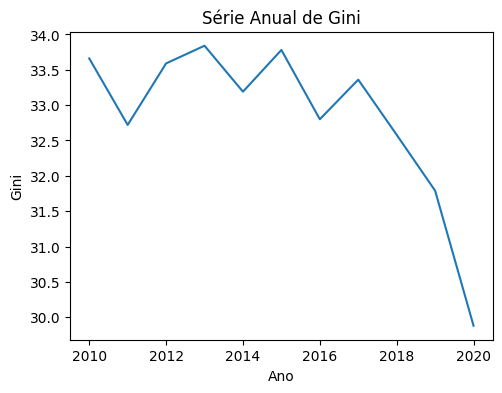

In [ ]:
# Filtrar Gini apenas para Canadá e anos consecutivos (2010–2020)
serie_can = (
    df_wid[df_wid['iso3'] == 'CAN']
    .sort_values('year')
    .set_index('year')['gini']
)

# Plotar série
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.plot(serie_can)
plt.title('Série Anual de Gini')
plt.xlabel('Ano')
plt.ylabel('Gini')

serie_can.index

In [ ]:
# Checar estacionariedade (ADF test)
resultado_adf = adfuller(serie_can.values)
print("ADF Statistic: {:.3f}".format(resultado_adf[0]))
print("p-value: {:.5f}".format(resultado_adf[1]))
for key, value in resultado_adf[4].items():
    print("Critério {}: {:.3f}".format(key, value))

# Se p-value > 0.05, a série não é estacionária -> precisa diferenciar
serie_diff = serie_can
d = 0 # Define o núemro de diferenciações
while resultado_adf[1] > 0.05:
  print("\nSerie não estacionária. Diferenciando...")
  serie_diff = serie_diff.diff().dropna()
  d = d + 1
  # Verifica resultado
  resultado_adf = adfuller(serie_diff.values)
  print(f"\nApós {d}ª diferença:")
  print("ADF Statistic: {:.3f}".format(resultado_adf[0]))
  print("p-value: {:.5f}".format(resultado_adf[1]))
  for key, value in resultado_adf[4].items():
      print("Critério {}: {:.3f}".format(key, value))

ADF Statistic: 1.775
p-value: 0.99830
Critério 1%: -4.665
Critério 5%: -3.367
Critério 10%: -2.803

Serie não estacionária. Diferenciando...

Após 1ª diferença:
ADF Statistic: 0.879
p-value: 0.99281
Critério 1%: -4.939
Critério 5%: -3.478
Critério 10%: -2.844

Serie não estacionária. Diferenciando...

Após 2ª diferença:
ADF Statistic: -6.678
p-value: 0.00000
Critério 1%: -4.665
Critério 5%: -3.367
Critério 10%: -2.803


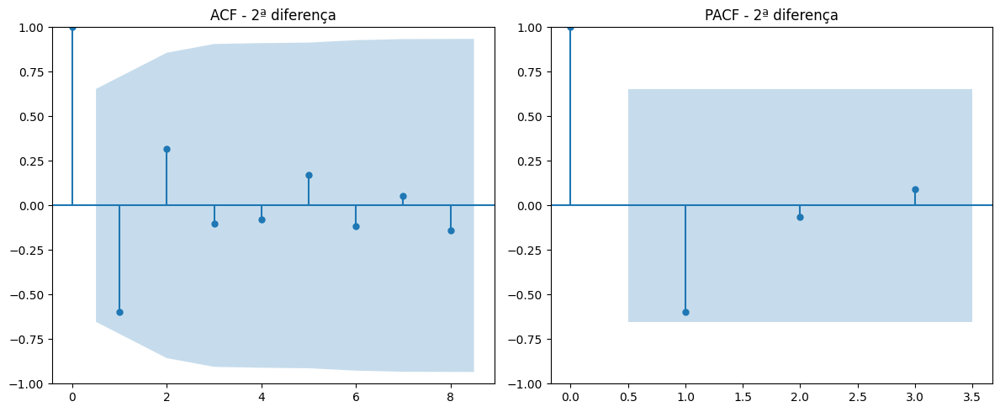

In [ ]:
# Plotar gráficos para achar p e q
plt.figure(figsize=(12,5))

n = len(serie_diff.dropna())
max_lags_acf = min(20, n - 1)
max_lags_pacf = min(max_lags_acf, (n // 2) - 1)

# Plotando ACF para definir q
# ACF com pequeno decaimento → q = 0 ou no máximo 1
plt.subplot(1, 2, 1)
plot_acf(serie_diff.dropna(), ax=plt.gca(), lags=max_lags_acf)
plt.title('ACF - 2ª diferença')

# Plotando PACF para definir p
# PACF com apenas o lag 1 significativo → p = 1.
plt.subplot(1, 2, 2)
plot_pacf(serie_diff.dropna(), ax=plt.gca(), lags=max_lags_pacf, method='ywm')
plt.title('PACF - 2ª diferença')

plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.



                               SARIMAX Results                                
Dep. Variable:                   gini   No. Observations:                   11
Model:                 ARIMA(0, 2, 1)   Log Likelihood                 -12.726
Date:                Wed, 04 Jun 2025   AIC                             29.452
Time:                        20:59:27   BIC                             29.847
Sample:                             0   HQIC                            28.601
                                 - 11                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7006      0.540     -1.296      0.195      -1.760       0.359
sigma2         0.9187      0.763      1.204      0.229      -0.577       2.414
Ljung-Box (L1) (Q):                   0.49   Jarque-

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.




Previsão para os próximos 3 anos:
2018   -1685.423718
2019   -1686.277953
2020   -1687.132188
Name: predicted_mean, dtype: float64


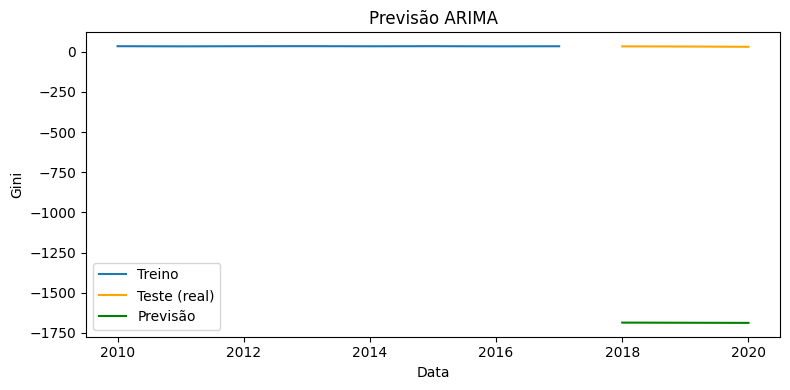

In [ ]:
# Definindo as ordens
p = 0
q = 1

# Split treino/teste (20% final)
train_size = int(len(serie_can) * 0.8)
train, test = serie_can.iloc[:train_size], serie_can.iloc[train_size:]

# Ajustar o modelo ARIMA
modelo = ARIMA(serie_can, order=(p,d,q))
modelo_ajustado = modelo.fit()

# Resumo do modelo
print(modelo_ajustado.summary())

# Fazer a previsão
previsao = modelo_ajustado.predict(start=test.index[0], end=test.index[-1])

print("\nPrevisão para os próximos 3 anos:")
print(previsao)

# Plot da previsão e do real
plt.figure(figsize=(8,4))
plt.plot(train.index, train, label='Treino')
plt.plot(test.index,  test,  label='Teste (real)', color='orange')
plt.plot(test.index,  previsao, label='Previsão', color='green')
plt.title('Previsão ARIMA')
plt.xlabel('Data')
plt.ylabel('Gini')
plt.legend()
plt.tight_layout()
plt.show()

### **Conclusão**

* Por ter poucos dados e não apresentar tendência ou sazonalidade, além da grande queda no final, a previsão torna-se muito instável;

* Em suma, não é possível modelar e prever a série temporal do coeficiente de Gini no Canadá usando um modelo ARIMA.

**Extra**

Tentativa de utilizar outro modelo que melhor modele os dados

In [ ]:
# Separa treino (até 2017) e define X e y
X_treino = serie_can.loc[:2017].index.values.reshape(-1, 1)
y_treino = serie_can.loc[:2017].values

# Ajusta os três modelos no conjunto de treino
linear_model = LinearRegression().fit(X_treino, y_treino)

poly = PolynomialFeatures(degree=2)
X_treino_poly = poly.fit_transform(X_treino)
quad_model = LinearRegression().fit(X_treino_poly, y_treino)

holt_model = ExponentialSmoothing(y_treino, trend='add', seasonal=None).fit()

# Gera previsões no intervalo de treino (para plot das linhas ajustadas)
pred_linear_treino = linear_model.predict(X_treino)
pred_quad_treino   = quad_model.predict(X_treino_poly)
pred_holt_treino   = holt_model.fittedvalues

# Gera previsões futuras (2018-2020)
anos_futuros = np.arange(2018, 2021).reshape(-1, 1)
pred_linear = linear_model.predict(anos_futuros)
anos_futuros_poly = poly.transform(anos_futuros)
pred_quad = quad_model.predict(anos_futuros_poly)
forecast_holt = holt_model.forecast(3)

# Ajusta os mesmos modelos usando o conjunto completo (sem separar)
X_full = serie_can.index.values.reshape(-1, 1)
y_full = serie_can.values

linear_full = LinearRegression().fit(X_full, y_full)

poly_full = PolynomialFeatures(degree=2)
X_full_poly = poly_full.fit_transform(X_full)
quad_full = LinearRegression().fit(X_full_poly, y_full)

holt_full = ExponentialSmoothing(y_full, trend='add', seasonal=None).fit()

# Previsões
pred_linear_full = linear_full.predict(X_full)
pred_quad_full   = quad_full.predict(X_full_poly)
pred_holt_full   = holt_full.fittedvalues

# Monta a figura
fig = go.Figure()

# Série Observada (sempre visível nos dois botões)
fig.add_trace(go.Scatter(
    x=serie_can.index,
    y=serie_can.values,
    mode='lines+markers',
    name='Observado',
    line=dict(color='black'),
    visible=True
))

# === TRACES DO AJUSTE NO TREINO (2010-2017) ===
# (somente visíveis no Botão “Treino + Previsão”)

# Linear – Ajuste (treino)
fig.add_trace(go.Scatter(
    x=X_treino.flatten(),
    y=pred_linear_treino,
    mode='lines',
    name='Linear (treino)',
    line=dict(color=verde_menta),
    visible=True
))

# Quadrático – Ajuste (treino)
fig.add_trace(go.Scatter(
    x=X_treino.flatten(),
    y=pred_quad_treino,
    mode='lines',
    name='Quadrático (treino)',
    line=dict(color=verde_musgo),
    visible=True
))

# Holt – Ajuste (treino)
fig.add_trace(go.Scatter(
    x=X_treino.flatten(),
    y=pred_holt_treino,
    mode='lines',
    name='Holt (treino)',
    line=dict(color=roxo),
    visible=True
))

# === TRACES DAS PREVISÕES FUTURAS (2018-2020) ===
# (também somente no Botão “Treino + Previsão”)

# Linear – Previsão
fig.add_trace(go.Scatter(
    x=anos_futuros.flatten(),
    y=pred_linear,
    mode='lines+markers',
    name='Linear (previsão)',
    line=dict(color=verde_menta, dash='dash'),
    visible=True
))

# Quadrático – Previsão
fig.add_trace(go.Scatter(
    x=anos_futuros.flatten(),
    y=pred_quad,
    mode='lines+markers',
    name='Quadrático (previsão)',
    line=dict(color=verde_musgo, dash='dash'),
    visible=True
))

# Holt – Previsão
fig.add_trace(go.Scatter(
    x=anos_futuros.flatten(),
    y=forecast_holt,
    mode='lines+markers',
    name='Holt (previsão)',
    line=dict(color=roxo, dash='dash'),
    visible=True
))

# === TRACES DO AJUSTE COM CONJUNTO COMPLETO (sem previsão) ===
# (somente visíveis no botão “Ajuste Completo”)

# Linear – Ajuste (completo)
fig.add_trace(go.Scatter(
    x=X_full.flatten(),
    y=pred_linear_full,
    mode='lines',
    name='Linear (completo)',
    line=dict(color=verde_menta),
    visible=False  # só aparecerá no segundo botão
))

# Quadrático – Ajuste (completo)
fig.add_trace(go.Scatter(
    x=X_full.flatten(),
    y=pred_quad_full,
    mode='lines',
    name='Quadrático (completo)',
    line=dict(color=verde_musgo),
    visible=False
))

# Holt – Ajuste (completo)
fig.add_trace(go.Scatter(
    x=X_full.flatten(),
    y=pred_holt_full,
    mode='lines',
    name='Holt (completo)',
    line=dict(color=roxo),
    visible=False
))

# Adiciona a “área de previsão” como uma forma retangular.
forecast_shape = dict(
    type="rect",
    x0=2017.5,
    y0=serie_can.min() - 0.02,
    x1=2020.5,
    y1=serie_can.max() + 0.02,
    fillcolor="lightgrey",
    opacity=0.3,
    layer="below",
    line_width=0
)

# Adiciona o shape apenas ao layout padrão (antes dos botões)
fig.update_layout(shapes=[forecast_shape])

# Configura os botões (updatemenus)
# Define, para cada botão, uma lista de booleanos que indica a visibilidade de cada uma das 10 traces (índices 0 a 9).

# Ordem das traces no fig.data:
# 0: Observado
# 1: Linear (treino)
# 2: Quadrático (treino)
# 3: Holt (treino)
# 4: Linear (previsão)
# 5: Quadrático (previsão)
# 6: Holt (previsão)
# 7: Linear (completo)
# 8: Quadrático (completo)
# 9: Holt (completo)

# Visibilidade para o Botão “Treino + Previsão”:
vis_treino_previsao = [
    True,   # Observado
    True,   # Linear (treino)
    True,   # Quadrático (treino)
    True,   # Holt (treino)
    True,   # Linear (previsão)
    True,   # Quadrático (previsão)
    True,   # Holt (previsão)
    False,  # Linear (completo)
    False,  # Quadrático (completo)
    False   # Holt (completo)
]

# Visibilidade para o Botão “Ajuste Completo”:
vis_ajuste_completo = [
    True,   # Observado
    False,  # Linear (treino)
    False,  # Quadrático (treino)
    False,  # Holt (treino)
    False,  # Linear (previsão)
    False,  # Quadrático (previsão)
    False,  # Holt (previsão)
    True,   # Linear (completo)
    True,   # Quadrático (completo)
    True    # Holt (completo)
]

# Montagem do layout com updatemenus
fig.update_layout(
    title="Evolução do Gini ao longo dos anos no Canadá",
    xaxis_title="Ano",
    yaxis_title="Gini",
    legend_title="Modelos",
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            x=0.5,
            y=1.12,
            showactive=True,
            buttons=[
                dict(
                    label="Treino + Previsão",
                    method="update",
                    args=[
                        {"visible": vis_treino_previsao},
                        {
                            "title": "Treino (até 2017) e Previsões (2018–2020)",
                            "shapes": [forecast_shape]
                        }
                    ]
                ),
                dict(
                    label="Ajuste Completo",
                    method="update",
                    args=[
                        {"visible": vis_ajuste_completo},
                        {
                            "title": "Ajuste de Todos os Dados (sem previsões)",
                            "shapes": []
                        }
                    ]
                )
            ]
        )
    ]
)

# Exibe a figura interativa
fig.show()

# **Referências**

CORRELATION ONE. **Last Mile of the Data Science Workflow**. Disponível em: <https://www.correlation-one.com/blog/last-mile-of-the-data-science-workflow>. Acesso em: 1 jun. 2025.

DE OLIVEIRA, R. **Projeto I - EDA** (Exploratory Data Analysis). Disponível em: <https://colab.research.google.com/drive/18V3on2RJFSax8CEVDTld0cnc23W0PNKn#scrollTo=leEpWNTpht5z>. Acesso em: 1 jun. 2025.

DE OLIVEIRA, R. **IMT_Exemplo_ARIMA_1_ex**. Disponível em: <https://colab.research.google.com/drive/19brY1-211WzOOjYP8klZB5-CuPrd4LuE#scrollTo=IpLSi8bLtwmF>. Acesso em: 1 jun. 2025.

DE OLIVEIRA, R. **IMT_Projeto_S1**. Disponível em: <https://colab.research.google.com/drive/18u_rYSSx0WglmrXJBiFWua6p60ypRhDS#scrollTo=cyibo5HrTRs7>. Acesso em: 1 jun. 2025.

DE OLIVEIRA, R. **Intervalos de Confiança e Testes de Hipótese**. Disponível em: <https://colab.research.google.com/drive/1XuQZyuy7ixrDIMlFGKpw-uHiJSapdKJt>. Acesso em: 1 jun. 2025.

DE OLIVEIRA, R., ABARRACIN, O. Y. E., SILVA, G. R. **Introdução às Séries Temporais: Uma Abordagem Prática em Python** [s.l.] Mackenzie, 2024.

DE OLIVEIRA, R. **Testes de Significância - Exemplos**. Disponível em: <https://colab.research.google.com/drive/1JFSZ0Ogie292ft7yEz8XMfaIhFq0XFhw>. Acesso em: 1 jun. 2025.

DE OLIVEIRA, R. **Visualização de Dados em Python**. [s.l.] Mackenzie, 2022.

PLOTLY. **Plotly Python Graphing Library**. Disponível em: <https://plotly.com/python/>. Acesso em: 1 jun. 2025.

# **Conclusão**

O presente estudo investigou de que forma a desigualdade econômica, medida pelo coeficiente de Gini (dados da World Inequality Database), se relaciona com a disparidade de gênero no mercado de trabalho, avaliada por indicadores da razão de participação e desemprego entre mulheres e homens (dados do World Bank). A análise estatística, comparativa e temporal permitiu identificar padrões relevantes e alcançar as seguintes conclusões gerais:

- Há uma correlação negativa e estatisticamente significativa entre desigualdade econômica e a participação relativa de mulheres no mercado de trabalho: países mais desiguais tendem a apresentar menor participação feminina em relação à masculina.
- Existe também uma associação moderada entre desigualdade de renda e a disparidade no desemprego entre gêneros, embora não seja uma relação monotônica estável, indicando a influência de outros fatores contextuais.
- A análise temporal de um caso específico (Canadá) sugere que reduções na desigualdade de renda caminham junto com maior equilíbrio na participação feminina e masculina no mercado de trabalho, embora choques conjunturais (como a pandemia em 2020) possam gerar desvios pontuais.
- Por fim, a comparação entre grupos de países com alto e baixo Gini confirmou que aqueles com maior desigualdade econômica possuem uma disparidade de gênero significativamente maior, evidenciada por uma razão de participação F/M mais baixa.

### Limitações da tecnologia e dos conceitos utilizados

Apesar dos achados relevantes, o estudo apresentou algumas limitações importantes:

1. **Qualidade e disponibilidade dos dados**: nem todos os países possuem séries temporais completas, coerentes e atualizadas sobre Gini e participação de gênero, o que restringiu as análises comparativas.
2. **Simplificação das relações causais**: a correlação não implica causalidade. Fatores estruturais, culturais e políticos influenciam a participação feminina e podem não estar diretamente relacionados ao Gini.
3. **Modelagem temporal**: o uso de modelos ARIMA para prever séries como o Gini mostrou-se inadequado para séries curtas, instáveis ou não estacionárias, como foi o caso do Canadá. Modelos mais robustos ou com maior capacidade de lidar com não linearidades podem ser necessários.
4. **Análise agregada**: indicadores como a razão F/M resumem desigualdades complexas e não captam nuances importantes, como a segregação ocupacional ou as diferenças salariais entre gêneros.

### Novos avanços e perspectivas

O avanço das tecnologias de dados e modelagem oferece caminhos promissores para superar parte dessas limitações:

* O uso de **modelos de aprendizado de máquina** (como Random Forests ou redes neurais) pode capturar relações não lineares e interações complexas entre variáveis socioeconômicas.
* **Modelos causais estruturais** e **métodos de inferência causal** (como o uso de variáveis instrumentais ou técnicas de controle sintético) podem ajudar a identificar relações de causa e efeito mais robustas.
* O avanço em modelos de séries temporais, como **Prophet** (desenvolvido pelo Facebook) ou **VAR** (modelos vetoriais autoregressivos), podem ser alternativas ao ARIMA para séries curtas ou com forte sazonalidade.

### Comparação com conceitos e tecnologias concorrentes

O estudo utilizou principalmente análises estatísticas tradicionais (correlação, t-test) e modelagem ARIMA. Embora adequadas, outras abordagens poderiam complementar ou mesmo superar essas técnicas em certos contextos:

| Técnica/Conceito                         | Vantagens                                                       | Desvantagens                                                |
|------------------------------------------|----------------------------------------------------------------|------------------------------------------------------------|
| **ARIMA**                               | Interpretação simples, clássico para séries estacionárias       | Requer séries longas e estacionárias, sensível a outliers   |
| **Prophet (Facebook)**                  | Robusto a séries curtas e descontinuidades, fácil de usar       | Pode superestimar tendências, menos interpretável que ARIMA |
| **Machine Learning (RF, XGBoost)**      | Captura não-linearidades, bom para múltiplos preditores         | Menos interpretável, risco de overfitting                   |
| **Modelos causais**                     | Foco na identificação de efeitos causais                        | Complexidade metodológica, necessidade de dados ricos       |
| **Análises qualitativas**               | Capta aspectos culturais e institucionais                       | Subjetividade, menos generalizáveis                         |

Em síntese, o estudo evidencia que a desigualdade econômica e a disparidade de gênero no mercado de trabalho estão associadas, mas ressalta que essas relações são multifacetadas e complexas. Avanços metodológicos e tecnológicos podem aprofundar a compreensão desse fenômeno.


# **Apêndice: Vídeo, GitHub e Datafólio**

Publique (YouTube ou qualquer outro de acesso público) um vídeo explicativo apresentando o seu trabalho em no máximo 4min. Foque na relevância do problema e nos resultados obtidos. Salve em um GitHub público seu projeto (o notebook Python, dados, Datafólio).

## **Vídeo**

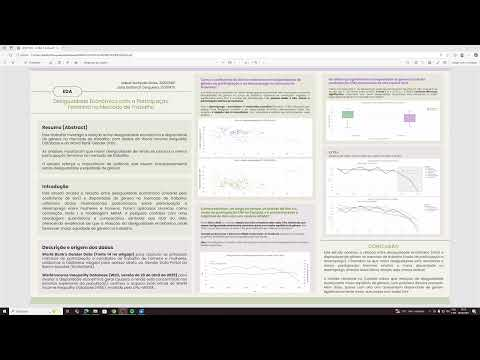

In [ ]:
from IPython.display import YouTubeVideo
YouTubeVideo('0ySIzn57VqU')

---

In [ ]:
#@markdown
#@title **Avaliação**
Completo = 10 #@param {type:"slider", min:0, max:10, step:1}
#@markdown São apresentadas 5-6 perguntas e empregadas estatísticas descritivas, seleções simples e múltiplas, agrupamentos e transformações dos dados.
Relevancia = 9 #@param {type:"slider", min:0, max:10, step:1}
#@markdown O tema é abordado corretamente e as perguntas e análises pertinentes ao problema.
Tecnicas = 10 #@param {type:"slider", min:0, max:10, step:1}
#@markdown As técnicas de gadas estatísticas dos dados, seleções, agrupamentos e transformações são corretamente aplicadas
Apresentacao = 5 #@param {type:"slider", min:0, max:10, step:1}
#@markdown A apresentação dos resultados é clara e objetiva
Conclusao = 3 #@param {type:"slider", min:0, max:10, step:1}
#@markdown As conclusões são justificadas e relevantes
Bonus = 0.5 #@param {type:"slider", min:0, max:1, step:0.5}
#@markdown A critério do professor por inovações na abordagem e no uso de técnicas de Análise de Dados

#@markdown ---
#@markdown ### Apresentação
Datafolio = 0 #@param {type:"slider", min:0, max:10, step:1}
Video = 0 #@param {type:"slider", min:0, max:10, step:1}





In [ ]:
#@markdown # **Nota Final**
Nota1 = Completo + Relevancia + Tecnicas + Apresentacao + Conclusao
Nota2 = Datafolio + Apresentacao

nota = (Nota1 + Nota2) / 7 + Bonus

nota = Nota1 / 5 + Bonus

print(f'Nota final do trabalho {nota :.1f}')

import numpy as np
import pandas as pd

alunos = pd.DataFrame()

lista_tia = []
lista_nome = []

for i in range(1,6):
  exec("if Aluno" + str(i) + " !='None':  lista = Aluno" + str(i) + ".split(','); lista_tia.append(lista[0]); lista_nome.append(lista[1].upper())")

alunos['tia'] = lista_tia
alunos['nome'] = lista_nome
alunos['nota'] = np.round(nota,1)
print()
display(alunos)

Nota final do trabalho 7.9



,tia,nome,nota
0,Izabel Sampaio Goes,21000980,7.9
1,Júlia Galhardi Cerqueira,21019975,7.9
